In [7]:
import os
import tensorflow as tf

# ✅ Ensure GPU is available
print(f"TensorFlow Version: {tf.__version__}")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"✅ GPU Detected: {gpus[0].name}")
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("🚀 GPU memory growth enabled.")
    except Exception as e:
        print("⚠️ Could not set memory growth:", e)
else:
    print("❌ No GPU found. Check your installation.")


TensorFlow Version: 2.10.0
✅ GPU Detected: /physical_device:GPU:0
⚠️ Could not set memory growth: Physical devices cannot be modified after being initialized


In [2]:
# Dataset path
DATASET_PATH = r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\unpaired_data"

IMG_HEIGHT, IMG_WIDTH = 256, 256
BATCH_SIZE = 16

def check_directory_exists(directory):
    if not os.path.exists(directory):
        raise FileNotFoundError(f"❌ Directory not found: {directory}")
    elif not os.listdir(directory):
        raise FileNotFoundError(f"⚠️ No files found in directory: {directory}")

In [3]:
# Load + preprocess
def load_and_preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = (image / 127.5) - 1  # Normalize to [-1, 1] for GANs
    return image

def create_dataset(directory, shuffle=True):
    check_directory_exists(directory)
    image_paths = tf.data.Dataset.list_files(os.path.join(directory, "*"), shuffle=shuffle)
    dataset = image_paths.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        dataset = dataset.shuffle(1000)
    return dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE).cache()

In [4]:
# Dataset folders
paths = {
    "Hazed_train": os.path.join(DATASET_PATH, "train", "Hazed"),
    "Dehazed_train": os.path.join(DATASET_PATH, "train", "Dehazed"),
    "Hazed_val": os.path.join(DATASET_PATH, "validation", "Hazed"),
    "Dehazed_val": os.path.join(DATASET_PATH, "validation", "Dehazed"),
    "Hazed_test": os.path.join(DATASET_PATH, "test", "Hazed"),
    "Dehazed_test": os.path.join(DATASET_PATH, "test", "Dehazed")
}

# Create datasets
datasets = {name: create_dataset(path, shuffle=("train" in name)) for name, path in paths.items()}

# Check dataset structure
for name, ds in datasets.items():
    for batch in ds.take(1):
        print(f"✅ {name} sample batch shape: {batch.shape}")

✅ Hazed_train sample batch shape: (16, 256, 256, 3)
✅ Dehazed_train sample batch shape: (16, 256, 256, 3)
✅ Hazed_val sample batch shape: (16, 256, 256, 3)
✅ Dehazed_val sample batch shape: (16, 256, 256, 3)
✅ Hazed_test sample batch shape: (16, 256, 256, 3)
✅ Dehazed_test sample batch shape: (16, 256, 256, 3)


In [5]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras import mixed_precision

# Enable mixed precision if GPU supports it
mixed_precision.set_global_policy("mixed_float16")


# Instance Normalization Layer (if preferred over BatchNorm)
class InstanceNormalization(layers.Layer):
    def __init__(self, epsilon=1e-5):
        super().__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name="scale", shape=input_shape[-1:], initializer="ones", trainable=True
        )
        self.offset = self.add_weight(
            name="offset", shape=input_shape[-1:], initializer="zeros", trainable=True
        )

    def call(self, inputs):
        mean, variance = tf.nn.moments(inputs, axes=[1, 2], keepdims=True)
        return self.scale * (inputs - mean) / tf.sqrt(variance + self.epsilon) + self.offset


# Residual block with InstanceNorm or BatchNorm
def residual_block(x, filters, use_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    res = x
    x = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)

    x = layers.add([x, res])
    return x


# Generator model (U-Net with residuals)
def build_generator(input_shape=(256, 256, 3), num_residual_blocks=9, use_instancenorm=True):
    inputs = layers.Input(shape=input_shape)
    initializer = tf.random_normal_initializer(0., 0.02)

    # Initial convolution block
    x = layers.Conv2D(64, kernel_size=7, strides=1, padding='same', kernel_initializer=initializer)(inputs)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Downsampling
    x = layers.Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, kernel_size=3, strides=2, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, 256, use_instancenorm)

    # Upsampling
    x = layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding='same', kernel_initializer=initializer)(x)
    x = InstanceNormalization()(x) if use_instancenorm else layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Output layer
    outputs = layers.Conv2D(3, kernel_size=7, strides=1, padding='same', activation='tanh', dtype='float32')(x)

    return Model(inputs, outputs, name="Generator")


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 4070 Laptop GPU, compute capability 8.9


In [6]:
generator_G = build_generator()  # Hazed → Dehazed
generator_F = build_generator()  # Dehazed → Hazed

generator_G.summary()
generator_F.summary()


Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 instance_normalization (Instan  (None, 256, 256, 64  128        ['conv2d[0][0]']                 
 ceNormalization)               )                                                         

In [7]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# Optional: Use InstanceNormalization if desired (more stable for CycleGANs)
try:
    from tensorflow_addons.layers import InstanceNormalization
    Norm = InstanceNormalization
except ImportError:
    Norm = layers.BatchNormalization  # fallback

def discriminator_block(x, filters, stride):
    x = layers.Conv2D(filters, kernel_size=4, strides=stride, padding='same')(x)
    x = Norm()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    return x

def build_discriminator(input_shape=(256, 256, 3), name="Discriminator"):
    inputs = layers.Input(shape=input_shape)

    x = layers.Conv2D(64, kernel_size=4, strides=2, padding='same')(inputs)  # No norm here
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = discriminator_block(x, 128, stride=2)
    x = discriminator_block(x, 256, stride=2)
    x = discriminator_block(x, 512, stride=1)  # stride 1 → keeps more spatial info

    # Output layer — PatchGAN (N x N x 1 grid)
    outputs = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(x)

    return Model(inputs, outputs, name=name)

# Instantiate Discriminators
discriminator_X = build_discriminator(name="Discriminator_Hazed")    # D_X
discriminator_Y = build_discriminator(name="Discriminator_Dehazed")  # D_Y

# Summary
discriminator_X.summary()
discriminator_Y.summary()


C:\Users\Admin\anaconda3\envs\aitf_env\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\Admin\anaconda3\envs\aitf_env\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.

Model: "Discriminator_Hazed"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_44 (Conv2D)          (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_45 (Conv2D)          (None, 64, 64, 128)       131200    
                                                                 
 instance_normalization_46 (  (None, 64, 64, 128)      256       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                               

In [8]:
# === Loss functions ===
mse_loss = tf.keras.losses.MeanSquaredError()

def discriminator_loss(real_output, generated_output):
    """
    Calculates the discriminator loss using Mean Squared Error.
    """
    real_loss = mse_loss(tf.ones_like(real_output), real_output)
    generated_loss = mse_loss(tf.zeros_like(generated_output), generated_output)
    return 0.5 * (real_loss + generated_loss)

def generator_loss(generated_output):
    """
    Calculates the generator adversarial loss.
    """
    return mse_loss(tf.ones_like(generated_output), generated_output)

def cycle_consistency_loss(real_image, cycled_image, lambda_cycle=10):
    """
    Measures how close the cycled image is to the original.
    Encourages cycle consistency: G(F(x)) ≈ x and F(G(y)) ≈ y
    """
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return lambda_cycle * loss

def identity_loss(real_image, same_image, lambda_identity=5):
    """
    Encourages the generator to preserve color/style if the input is already from target domain.
    """
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return lambda_identity * loss

In [9]:
# === Optimizers ===
lr = 2e-4
beta1 = 0.5

generator_G_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta1)
generator_F_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta1)
discriminator_X_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta1)
discriminator_Y_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta1)


"""
Gradient penalty (for WGAN-GP style)

Mixed Precision (for GPU optimization)

Perceptual Loss (VGG-based)
"""


'\nGradient penalty (for WGAN-GP style)\n\nMixed Precision (for GPU optimization)\n\nPerceptual Loss (VGG-based)\n'

In [10]:
# === Training Step ===
@tf.function
def train_step(real_X, real_Y):
    with tf.GradientTape(persistent=True) as tape:
        # === Forward Pass ===
        fake_Y = generator_G(real_X, training=True)
        fake_X = generator_F(real_Y, training=True)

        cycled_X = generator_F(fake_Y, training=True)
        cycled_Y = generator_G(fake_X, training=True)

        same_X = generator_F(real_X, training=True)
        same_Y = generator_G(real_Y, training=True)

        # === Discriminator Outputs ===
        disc_real_X = discriminator_X(real_X, training=True)
        disc_real_Y = discriminator_Y(real_Y, training=True)
        disc_fake_X = discriminator_X(fake_X, training=True)
        disc_fake_Y = discriminator_Y(fake_Y, training=True)

        # === Generator Losses ===
        gen_G_loss = tf.cast(generator_loss(disc_fake_Y), tf.float32)
        gen_F_loss = tf.cast(generator_loss(disc_fake_X), tf.float32)
        cycle_loss = tf.cast(cycle_consistency_loss(real_X, cycled_X) + cycle_consistency_loss(real_Y, cycled_Y), tf.float32)
        id_loss_G = tf.cast(identity_loss(real_Y, same_Y), tf.float32)
        id_loss_F = tf.cast(identity_loss(real_X, same_X), tf.float32)
        

        # Force all losses to be float32
        gen_G_loss = tf.cast(gen_G_loss, tf.float32)
        gen_F_loss = tf.cast(gen_F_loss, tf.float32)
        cycle_loss = tf.cast(cycle_loss, tf.float32)
        id_loss_G = tf.cast(id_loss_G, tf.float32)
        id_loss_F = tf.cast(id_loss_F, tf.float32)
        
        # Now safe to adderror
        total_gen_G_loss = gen_G_loss + cycle_loss + id_loss_G
        total_gen_F_loss = gen_F_loss + cycle_loss + id_loss_F
        

        # === Discriminator Losses ===
        disc_X_loss = discriminator_loss(disc_real_X, disc_fake_X)
        disc_Y_loss = discriminator_loss(disc_real_Y, disc_fake_Y)

    # === Apply Gradients ===
    generator_G_optimizer.apply_gradients(zip(tape.gradient(total_gen_G_loss, generator_G.trainable_variables), generator_G.trainable_variables))
    generator_F_optimizer.apply_gradients(zip(tape.gradient(total_gen_F_loss, generator_F.trainable_variables), generator_F.trainable_variables))
    discriminator_X_optimizer.apply_gradients(zip(tape.gradient(disc_X_loss, discriminator_X.trainable_variables), discriminator_X.trainable_variables))
    discriminator_Y_optimizer.apply_gradients(zip(tape.gradient(disc_Y_loss, discriminator_Y.trainable_variables), discriminator_Y.trainable_variables))

    return {
        "gen_G_loss": total_gen_G_loss,
        "gen_F_loss": total_gen_F_loss,
        "disc_X_loss": disc_X_loss,
        "disc_Y_loss": disc_Y_loss
    }

In [11]:
import os
import tensorflow as tf
from tqdm import tqdm

# Define the paths to your hazy and dehazed training image folders
input_dir = r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\unpaired_data\train\Hazed"
target_dir = r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\unpaired_data\train\Dehazed"

# Step 1: Define preprocessing and loading functions
def preprocess_flat_image(file_path, image_size=(256, 256)):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, image_size)
    img = tf.cast(img, tf.float32) / 255.0
    return img

def load_flat_directory(image_folder, image_size=(256, 256), batch_size=1):
    # Collect all supported extensions
    patterns = ["*.png", "*.jpg", "*.jpeg", "*.PNG", "*.JPG", "*.JPEG"]
    
    matched_files = []
    for pattern in patterns:
        matched_files.extend(tf.io.gfile.glob(os.path.join(image_folder, pattern)))
    
    if not matched_files:
        raise FileNotFoundError(f"No image files found in {image_folder}")
    
    # Create the dataset
    file_list = tf.data.Dataset.from_tensor_slices(matched_files)
    dataset = file_list.map(lambda x: preprocess_flat_image(x, image_size), num_parallel_calls=tf.data.AUTOTUNE)
    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

In [12]:
# Step 2: Load the datasets
Hazed_train_ds = load_flat_directory(input_dir)
Dehazed_train_ds = load_flat_directory(target_dir)

# Step 3: Now start your training loop
for real_X, real_Y in tqdm(tf.data.Dataset.zip((Hazed_train_ds, Dehazed_train_ds)), desc="Batches", leave=False):
    losses = train_step(real_X, real_Y)
    # (Add loss logging, model saving, etc.)




# === Setup Checkpoint Directory ===
CHECKPOINT_DIR = "./checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

checkpoint = tf.train.Checkpoint(
    generator_G=generator_G, generator_F=generator_F,
    discriminator_X=discriminator_X, discriminator_Y=discriminator_Y,
    generator_G_optimizer=generator_G_optimizer,
    generator_F_optimizer=generator_F_optimizer,
    discriminator_X_optimizer=discriminator_X_optimizer,
    discriminator_Y_optimizer=discriminator_Y_optimizer,
    epoch=tf.Variable(0)
)
manager = tf.train.CheckpointManager(checkpoint, CHECKPOINT_DIR, max_to_keep=5)

# === Restore Previous Training if Available ===
if manager.latest_checkpoint:
    checkpoint.restore(manager.latest_checkpoint)
    start_epoch = checkpoint.epoch.numpy()
    print(f"✅ Restored from checkpoint: {manager.latest_checkpoint} | Starting from epoch {start_epoch}")
else:
    start_epoch = 0
    print("🚀 No checkpoint found. Starting from scratch.")

# === Main Training Loop ===
EPOCHS = 200  # Adjust as needed

for epoch in tqdm(range(start_epoch, EPOCHS), desc="Training Epochs"):
    tqdm.write(f"\n🌟 Starting Epoch {epoch + 1}/{EPOCHS}")

    epoch_losses = {"gen_G_loss": 0.0, "gen_F_loss": 0.0, "disc_X_loss": 0.0, "disc_Y_loss": 0.0}
    num_batches = 0

    for real_X, real_Y in tqdm(tf.data.Dataset.zip((Hazed_train_ds, Dehazed_train_ds)), desc="Batches", leave=False):
        losses = train_step(real_X, real_Y)
        for key in epoch_losses:
            epoch_losses[key] += losses[key]
        num_batches += 1

    # === Epoch Averages ===
    avg_losses = {k: float(v) / num_batches for k, v in epoch_losses.items()}
    tqdm.write(f"📊 Epoch {epoch + 1} Losses: {avg_losses}")

    # === Save Checkpoint ===
    checkpoint.epoch.assign(epoch + 1)
    manager.save()
    tqdm.write(f"💾 Checkpoint saved for epoch {epoch + 1}")

# === Save Final Model ===
generator_G.save("Nilesh_cycleGAN_dehaze.h5")
print("✅ Final Generator G (Hazed → Dehazed) model saved.")

✅ Restored from checkpoint: ./checkpoints\ckpt-100 | Starting from epoch 100


Training Epochs:   0%|                                                       | 0/100 [00:00<?, ?it/s]


🌟 Starting Epoch 101/200



Training Epochs:   0%|                                                       | 0/100 [04:39<?, ?it/s]

📊 Epoch 101 Losses: {'gen_G_loss': 1.8359613050949546, 'gen_F_loss': 2.027414058071145, 'disc_X_loss': 0.005181760204081632, 'disc_Y_loss': 0.09878117913832199}


Training Epochs:   1%|▍                                           | 1/100 [04:41<7:43:54, 281.16s/it]

💾 Checkpoint saved for epoch 101

🌟 Starting Epoch 102/200



Training Epochs:   1%|▍                                           | 1/100 [09:21<7:43:54, 281.16s/it]

📊 Epoch 102 Losses: {'gen_G_loss': 1.843796918181335, 'gen_F_loss': 2.0300196087549605, 'disc_X_loss': 0.007210175736961451, 'disc_Y_loss': 0.09956065759637188}


Training Epochs:   2%|▉                                           | 2/100 [09:22<7:39:27, 281.30s/it]

💾 Checkpoint saved for epoch 102

🌟 Starting Epoch 103/200



Training Epochs:   2%|▉                                           | 2/100 [14:02<7:39:27, 281.30s/it]

📊 Epoch 103 Losses: {'gen_G_loss': 1.855124268131732, 'gen_F_loss': 2.0586935376364086, 'disc_X_loss': 0.004552862811791384, 'disc_Y_loss': 0.10069444444444445}


Training Epochs:   3%|█▎                                          | 3/100 [14:03<7:34:37, 281.21s/it]

💾 Checkpoint saved for epoch 103

🌟 Starting Epoch 104/200



Training Epochs:   3%|█▎                                          | 3/100 [18:43<7:34:37, 281.21s/it]

📊 Epoch 104 Losses: {'gen_G_loss': 1.8410272230637046, 'gen_F_loss': 2.028760706756661, 'disc_X_loss': 0.004964746315192743, 'disc_Y_loss': 0.09700963718820861}


Training Epochs:   4%|█▊                                          | 4/100 [18:44<7:29:58, 281.24s/it]

💾 Checkpoint saved for epoch 104

🌟 Starting Epoch 105/200



Training Epochs:   4%|█▊                                          | 4/100 [23:24<7:29:58, 281.24s/it]

📊 Epoch 105 Losses: {'gen_G_loss': 1.904566343138818, 'gen_F_loss': 2.0720332485207624, 'disc_X_loss': 0.004743303571428571, 'disc_Y_loss': 0.09176587301587301}


Training Epochs:   5%|██▏                                         | 5/100 [23:26<7:25:12, 281.18s/it]

💾 Checkpoint saved for epoch 105

🌟 Starting Epoch 106/200



Training Epochs:   5%|██▏                                         | 5/100 [28:05<7:25:12, 281.18s/it]

📊 Epoch 106 Losses: {'gen_G_loss': 1.85222931946216, 'gen_F_loss': 2.0120740272020265, 'disc_X_loss': 0.006776147959183673, 'disc_Y_loss': 0.09176587301587301}


Training Epochs:   6%|██▋                                         | 6/100 [28:07<7:20:30, 281.17s/it]

💾 Checkpoint saved for epoch 106

🌟 Starting Epoch 107/200



Training Epochs:   6%|██▋                                         | 6/100 [32:47<7:20:30, 281.17s/it]

📊 Epoch 107 Losses: {'gen_G_loss': 1.8237747572987528, 'gen_F_loss': 2.023233495872307, 'disc_X_loss': 0.004351349914965987, 'disc_Y_loss': 0.10352891156462585}


Training Epochs:   7%|███                                         | 7/100 [32:48<7:15:48, 281.17s/it]

💾 Checkpoint saved for epoch 107

🌟 Starting Epoch 108/200



Training Epochs:   7%|███                                         | 7/100 [37:28<7:15:48, 281.17s/it]

📊 Epoch 108 Losses: {'gen_G_loss': 1.8621033130048894, 'gen_F_loss': 2.032158192052863, 'disc_X_loss': 0.004885026927437642, 'disc_Y_loss': 0.09417517006802721}


Training Epochs:   8%|███▌                                        | 8/100 [37:29<7:11:04, 281.14s/it]

💾 Checkpoint saved for epoch 108

🌟 Starting Epoch 109/200



Training Epochs:   8%|███▌                                        | 8/100 [42:09<7:11:04, 281.14s/it]

📊 Epoch 109 Losses: {'gen_G_loss': 1.8344787459254535, 'gen_F_loss': 2.0555190175028346, 'disc_X_loss': 0.005412060657596372, 'disc_Y_loss': 0.10196995464852608}


Training Epochs:   9%|███▉                                        | 9/100 [42:10<7:06:21, 281.12s/it]

💾 Checkpoint saved for epoch 109

🌟 Starting Epoch 110/200



Training Epochs:   9%|███▉                                        | 9/100 [46:50<7:06:21, 281.12s/it]

📊 Epoch 110 Losses: {'gen_G_loss': 1.8390188757794785, 'gen_F_loss': 2.0176435890111253, 'disc_X_loss': 0.005017892573696145, 'disc_Y_loss': 0.09623015873015874}


Training Epochs:  10%|████▎                                      | 10/100 [46:51<7:01:41, 281.12s/it]

💾 Checkpoint saved for epoch 110

🌟 Starting Epoch 111/200



Training Epochs:  10%|████▎                                      | 10/100 [51:31<7:01:41, 281.12s/it]

📊 Epoch 111 Losses: {'gen_G_loss': 1.8058279301303855, 'gen_F_loss': 1.9947504229556405, 'disc_X_loss': 0.0052924815759637185, 'disc_Y_loss': 0.09856859410430839}


Training Epochs:  11%|████▋                                      | 11/100 [51:32<6:56:58, 281.11s/it]

💾 Checkpoint saved for epoch 111

🌟 Starting Epoch 112/200



Training Epochs:  11%|████▋                                      | 11/100 [56:12<6:56:58, 281.11s/it]

📊 Epoch 112 Losses: {'gen_G_loss': 1.816685129455428, 'gen_F_loss': 2.0018925050488945, 'disc_X_loss': 0.0043314200680272105, 'disc_Y_loss': 0.09268707482993198}


Training Epochs:  12%|█████▏                                     | 12/100 [56:13<6:52:16, 281.09s/it]

💾 Checkpoint saved for epoch 112

🌟 Starting Epoch 113/200



Training Epochs:  12%|████▉                                    | 12/100 [1:00:53<6:52:16, 281.09s/it]

📊 Epoch 113 Losses: {'gen_G_loss': 1.8268247158889597, 'gen_F_loss': 2.0038942090508076, 'disc_X_loss': 0.00467687074829932, 'disc_Y_loss': 0.09488378684807257}


Training Epochs:  13%|█████▎                                   | 13/100 [1:00:54<6:47:30, 281.04s/it]

💾 Checkpoint saved for epoch 113

🌟 Starting Epoch 114/200



Training Epochs:  13%|█████▎                                   | 13/100 [1:05:34<6:47:30, 281.04s/it]

📊 Epoch 114 Losses: {'gen_G_loss': 1.8489555652990364, 'gen_F_loss': 2.005333863688705, 'disc_X_loss': 0.0057442247732426305, 'disc_Y_loss': 0.08793934240362812}


Training Epochs:  14%|█████▋                                   | 14/100 [1:05:36<6:43:05, 281.22s/it]

💾 Checkpoint saved for epoch 114

🌟 Starting Epoch 115/200



Training Epochs:  14%|█████▋                                   | 14/100 [1:10:16<6:43:05, 281.22s/it]

📊 Epoch 115 Losses: {'gen_G_loss': 1.8334710430396117, 'gen_F_loss': 2.011923446136267, 'disc_X_loss': 0.0039771116780045355, 'disc_Y_loss': 0.09452947845804989}


Training Epochs:  15%|██████▏                                  | 15/100 [1:10:17<6:38:23, 281.21s/it]

💾 Checkpoint saved for epoch 115

🌟 Starting Epoch 116/200



Training Epochs:  15%|██████▏                                  | 15/100 [1:14:57<6:38:23, 281.21s/it]

📊 Epoch 116 Losses: {'gen_G_loss': 1.8480523557079083, 'gen_F_loss': 2.007314669031675, 'disc_X_loss': 0.004391209608843537, 'disc_Y_loss': 0.08666383219954649}


Training Epochs:  16%|██████▌                                  | 16/100 [1:14:58<6:33:36, 281.14s/it]

💾 Checkpoint saved for epoch 116

🌟 Starting Epoch 117/200



Training Epochs:  16%|██████▌                                  | 16/100 [1:19:38<6:33:36, 281.14s/it]

📊 Epoch 117 Losses: {'gen_G_loss': 1.8337049419377125, 'gen_F_loss': 2.0083659684576958, 'disc_X_loss': 0.006820436507936508, 'disc_Y_loss': 0.09041950113378684}


Training Epochs:  17%|██████▉                                  | 17/100 [1:19:39<6:28:49, 281.08s/it]

💾 Checkpoint saved for epoch 117

🌟 Starting Epoch 118/200



Training Epochs:  17%|██████▉                                  | 17/100 [1:24:19<6:28:49, 281.08s/it]

📊 Epoch 118 Losses: {'gen_G_loss': 1.8623819156568877, 'gen_F_loss': 2.01030580689307, 'disc_X_loss': 0.0037888853458049885, 'disc_Y_loss': 0.08262471655328799}


Training Epochs:  18%|███████▍                                 | 18/100 [1:24:20<6:24:05, 281.04s/it]

💾 Checkpoint saved for epoch 118

🌟 Starting Epoch 119/200



Training Epochs:  18%|███████▍                                 | 18/100 [1:29:00<6:24:05, 281.04s/it]

📊 Epoch 119 Losses: {'gen_G_loss': 1.9182858283287274, 'gen_F_loss': 2.0484331265058104, 'disc_X_loss': 0.0036383042800453517, 'disc_Y_loss': 0.0818452380952381}


Training Epochs:  19%|███████▊                                 | 19/100 [1:29:01<6:19:19, 280.98s/it]

💾 Checkpoint saved for epoch 119

🌟 Starting Epoch 120/200



Training Epochs:  19%|███████▊                                 | 19/100 [1:33:40<6:19:19, 280.98s/it]

📊 Epoch 120 Losses: {'gen_G_loss': 1.8710628864175878, 'gen_F_loss': 2.006927836238662, 'disc_X_loss': 0.005398774092970521, 'disc_Y_loss': 0.07879818594104308}


Training Epochs:  20%|████████▏                                | 20/100 [1:33:42<6:14:37, 280.97s/it]

💾 Checkpoint saved for epoch 120

🌟 Starting Epoch 121/200



Training Epochs:  20%|████████▏                                | 20/100 [1:38:21<6:14:37, 280.97s/it]

📊 Epoch 121 Losses: {'gen_G_loss': 1.8445909288194444, 'gen_F_loss': 2.0004276612988945, 'disc_X_loss': 0.00598781179138322, 'disc_Y_loss': 0.08659297052154195}


Training Epochs:  21%|████████▌                                | 21/100 [1:38:22<6:09:51, 280.91s/it]

💾 Checkpoint saved for epoch 121

🌟 Starting Epoch 122/200



Training Epochs:  21%|████████▌                                | 21/100 [1:43:02<6:09:51, 280.91s/it]

📊 Epoch 122 Losses: {'gen_G_loss': 1.848255252621882, 'gen_F_loss': 1.9930285672211594, 'disc_X_loss': 0.003784456490929705, 'disc_Y_loss': 0.08142006802721088}


Training Epochs:  22%|█████████                                | 22/100 [1:43:03<6:05:07, 280.86s/it]

💾 Checkpoint saved for epoch 122

🌟 Starting Epoch 123/200



Training Epochs:  22%|█████████                                | 22/100 [1:47:43<6:05:07, 280.86s/it]

📊 Epoch 123 Losses: {'gen_G_loss': 1.827489320923682, 'gen_F_loss': 1.9951984293066185, 'disc_X_loss': 0.004413353883219955, 'disc_Y_loss': 0.08864795918367346}


Training Epochs:  23%|█████████▍                               | 23/100 [1:47:44<6:00:28, 280.89s/it]

💾 Checkpoint saved for epoch 123

🌟 Starting Epoch 124/200



Training Epochs:  23%|█████████▍                               | 23/100 [1:52:24<6:00:28, 280.89s/it]

📊 Epoch 124 Losses: {'gen_G_loss': 1.8254538469033448, 'gen_F_loss': 1.9938699112457483, 'disc_X_loss': 0.0040391156462585035, 'disc_Y_loss': 0.08786848072562359}


Training Epochs:  24%|█████████▊                               | 24/100 [1:52:25<5:55:50, 280.93s/it]

💾 Checkpoint saved for epoch 124

🌟 Starting Epoch 125/200



Training Epochs:  24%|█████████▊                               | 24/100 [1:57:05<5:55:50, 280.93s/it]

📊 Epoch 125 Losses: {'gen_G_loss': 1.8429795176534156, 'gen_F_loss': 1.983204951902636, 'disc_X_loss': 0.003722452522675737, 'disc_Y_loss': 0.08312074829931973}


Training Epochs:  25%|██████████▎                              | 25/100 [1:57:06<5:51:09, 280.92s/it]

💾 Checkpoint saved for epoch 125

🌟 Starting Epoch 126/200



Training Epochs:  25%|██████████▎                              | 25/100 [2:01:47<5:51:09, 280.92s/it]

📊 Epoch 126 Losses: {'gen_G_loss': 1.8185774961026078, 'gen_F_loss': 1.9841125903486394, 'disc_X_loss': 0.003618374433106576, 'disc_Y_loss': 0.08893140589569161}


Training Epochs:  26%|██████████▋                              | 26/100 [2:01:48<5:46:55, 281.29s/it]

💾 Checkpoint saved for epoch 126

🌟 Starting Epoch 127/200



Training Epochs:  26%|██████████▋                              | 26/100 [2:06:28<5:46:55, 281.29s/it]

📊 Epoch 127 Losses: {'gen_G_loss': 1.827254453213577, 'gen_F_loss': 1.976237532773526, 'disc_X_loss': 0.005766369047619048, 'disc_Y_loss': 0.08283730158730158}


Training Epochs:  27%|███████████                              | 27/100 [2:06:29<5:42:05, 281.17s/it]

💾 Checkpoint saved for epoch 127

🌟 Starting Epoch 128/200



Training Epochs:  27%|███████████                              | 27/100 [2:11:09<5:42:05, 281.17s/it]

📊 Epoch 128 Losses: {'gen_G_loss': 1.83310649292269, 'gen_F_loss': 1.989170481017928, 'disc_X_loss': 0.003729095804988662, 'disc_Y_loss': 0.08283730158730158}


Training Epochs:  28%|███████████▍                             | 28/100 [2:11:10<5:37:23, 281.16s/it]

💾 Checkpoint saved for epoch 128

🌟 Starting Epoch 129/200



Training Epochs:  28%|███████████▍                             | 28/100 [2:15:50<5:37:23, 281.16s/it]

📊 Epoch 129 Losses: {'gen_G_loss': 1.7984958224826388, 'gen_F_loss': 1.9736598008343962, 'disc_X_loss': 0.003963825113378685, 'disc_Y_loss': 0.08886054421768708}


Training Epochs:  29%|███████████▉                             | 29/100 [2:15:52<5:32:45, 281.21s/it]

💾 Checkpoint saved for epoch 129

🌟 Starting Epoch 130/200



Training Epochs:  29%|███████████▉                             | 29/100 [2:20:31<5:32:45, 281.21s/it]

📊 Epoch 130 Losses: {'gen_G_loss': 1.8426761410944585, 'gen_F_loss': 2.0039282558726614, 'disc_X_loss': 0.004437712585034013, 'disc_Y_loss': 0.0858843537414966}


Training Epochs:  30%|████████████▎                            | 30/100 [2:20:33<5:28:02, 281.18s/it]

💾 Checkpoint saved for epoch 130

🌟 Starting Epoch 131/200



Training Epochs:  30%|████████████▎                            | 30/100 [2:25:13<5:28:02, 281.18s/it]

📊 Epoch 131 Losses: {'gen_G_loss': 1.8120247285111961, 'gen_F_loss': 1.9871921669058248, 'disc_X_loss': 0.0030935551303854876, 'disc_Y_loss': 0.08878968253968254}


Training Epochs:  31%|████████████▋                            | 31/100 [2:25:14<5:23:25, 281.23s/it]

💾 Checkpoint saved for epoch 131

🌟 Starting Epoch 132/200



Training Epochs:  31%|████████████▋                            | 31/100 [2:29:54<5:23:25, 281.23s/it]

📊 Epoch 132 Losses: {'gen_G_loss': 1.830923344272605, 'gen_F_loss': 1.985990840020904, 'disc_X_loss': 0.004402281746031746, 'disc_Y_loss': 0.08439625850340136}


Training Epochs:  32%|█████████████                            | 32/100 [2:29:56<5:18:54, 281.39s/it]

💾 Checkpoint saved for epoch 132

🌟 Starting Epoch 133/200



Training Epochs:  32%|█████████████                            | 32/100 [2:34:36<5:18:54, 281.39s/it]

📊 Epoch 133 Losses: {'gen_G_loss': 1.8377238509336027, 'gen_F_loss': 2.007988408579578, 'disc_X_loss': 0.0035851580215419503, 'disc_Y_loss': 0.08517573696145125}


Training Epochs:  33%|█████████████▌                           | 33/100 [2:34:37<5:14:12, 281.39s/it]

💾 Checkpoint saved for epoch 133

🌟 Starting Epoch 134/200



Training Epochs:  33%|█████████████▌                           | 33/100 [2:39:17<5:14:12, 281.39s/it]

📊 Epoch 134 Losses: {'gen_G_loss': 1.7997926465508078, 'gen_F_loss': 1.9543991261869331, 'disc_X_loss': 0.0031001984126984125, 'disc_Y_loss': 0.08411281179138322}


Training Epochs:  34%|█████████████▉                           | 34/100 [2:39:18<5:09:28, 281.34s/it]

💾 Checkpoint saved for epoch 134

🌟 Starting Epoch 135/200



Training Epochs:  34%|█████████████▉                           | 34/100 [2:43:58<5:09:28, 281.34s/it]

📊 Epoch 135 Losses: {'gen_G_loss': 1.8037520428093112, 'gen_F_loss': 1.9529341440352181, 'disc_X_loss': 0.004116620606575964, 'disc_Y_loss': 0.0824829931972789}


Training Epochs:  35%|██████████████▎                          | 35/100 [2:43:59<5:04:41, 281.26s/it]

💾 Checkpoint saved for epoch 135

🌟 Starting Epoch 136/200



Training Epochs:  35%|██████████████▎                          | 35/100 [2:48:40<5:04:41, 281.26s/it]

📊 Epoch 136 Losses: {'gen_G_loss': 1.8708563910590277, 'gen_F_loss': 1.9814523709874574, 'disc_X_loss': 0.004876169217687075, 'disc_Y_loss': 0.07454648526077097}


Training Epochs:  36%|██████████████▊                          | 36/100 [2:48:41<5:00:02, 281.29s/it]

💾 Checkpoint saved for epoch 136

🌟 Starting Epoch 137/200



Training Epochs:  36%|██████████████▊                          | 36/100 [2:53:21<5:00:02, 281.29s/it]

📊 Epoch 137 Losses: {'gen_G_loss': 1.845384801055839, 'gen_F_loss': 1.9833837669182257, 'disc_X_loss': 0.00403468679138322, 'disc_Y_loss': 0.07688492063492064}


Training Epochs:  37%|███████████████▏                         | 37/100 [2:53:22<4:55:25, 281.36s/it]

💾 Checkpoint saved for epoch 137

🌟 Starting Epoch 138/200



Training Epochs:  37%|███████████████▏                         | 37/100 [2:58:03<4:55:25, 281.36s/it]

📊 Epoch 138 Losses: {'gen_G_loss': 1.8667577626753826, 'gen_F_loss': 1.9887756209254535, 'disc_X_loss': 0.002920829790249433, 'disc_Y_loss': 0.07397959183673469}


Training Epochs:  38%|███████████████▌                         | 38/100 [2:58:04<4:50:51, 281.47s/it]

💾 Checkpoint saved for epoch 138

🌟 Starting Epoch 139/200



Training Epochs:  38%|███████████████▌                         | 38/100 [3:02:45<4:50:51, 281.47s/it]

📊 Epoch 139 Losses: {'gen_G_loss': 1.8503411048664258, 'gen_F_loss': 1.9723354348249718, 'disc_X_loss': 0.003128985969387755, 'disc_Y_loss': 0.07539682539682539}


Training Epochs:  39%|███████████████▉                         | 39/100 [3:02:46<4:46:13, 281.53s/it]

💾 Checkpoint saved for epoch 139

🌟 Starting Epoch 140/200



Training Epochs:  39%|███████████████▉                         | 39/100 [3:07:26<4:46:13, 281.53s/it]

📊 Epoch 140 Losses: {'gen_G_loss': 1.8287979091376134, 'gen_F_loss': 1.9607153652476617, 'disc_X_loss': 0.0029916914682539685, 'disc_Y_loss': 0.0782312925170068}


Training Epochs:  40%|████████████████▍                        | 40/100 [3:07:27<4:41:34, 281.58s/it]

💾 Checkpoint saved for epoch 140

🌟 Starting Epoch 141/200



Training Epochs:  40%|████████████████▍                        | 40/100 [3:12:08<4:41:34, 281.58s/it]

📊 Epoch 141 Losses: {'gen_G_loss': 1.8273178411989797, 'gen_F_loss': 1.9578068532100341, 'disc_X_loss': 0.0038132440476190475, 'disc_Y_loss': 0.0763888888888889}


Training Epochs:  41%|████████████████▊                        | 41/100 [3:12:09<4:36:53, 281.58s/it]

💾 Checkpoint saved for epoch 141

🌟 Starting Epoch 142/200



Training Epochs:  41%|████████████████▊                        | 41/100 [3:16:50<4:36:53, 281.58s/it]

📊 Epoch 142 Losses: {'gen_G_loss': 1.8660622940582483, 'gen_F_loss': 1.9799717494419642, 'disc_X_loss': 0.005558212868480726, 'disc_Y_loss': 0.07568027210884354}


Training Epochs:  42%|█████████████████▏                       | 42/100 [3:16:51<4:32:23, 281.79s/it]

💾 Checkpoint saved for epoch 142

🌟 Starting Epoch 143/200



Training Epochs:  42%|█████████████████▏                       | 42/100 [3:21:32<4:32:23, 281.79s/it]

📊 Epoch 143 Losses: {'gen_G_loss': 1.83259454497945, 'gen_F_loss': 1.9671474465437218, 'disc_X_loss': 0.0029894770408163264, 'disc_Y_loss': 0.07645975056689343}


Training Epochs:  43%|█████████████████▋                       | 43/100 [3:21:33<4:27:40, 281.76s/it]

💾 Checkpoint saved for epoch 143

🌟 Starting Epoch 144/200



Training Epochs:  43%|█████████████████▋                       | 43/100 [3:26:14<4:27:40, 281.76s/it]

📊 Epoch 144 Losses: {'gen_G_loss': 1.8769697332057824, 'gen_F_loss': 1.992878539762259, 'disc_X_loss': 0.002803465136054422, 'disc_Y_loss': 0.07217261904761904}


Training Epochs:  44%|██████████████████                       | 44/100 [3:26:15<4:23:00, 281.80s/it]

💾 Checkpoint saved for epoch 144

🌟 Starting Epoch 145/200



Training Epochs:  44%|██████████████████                       | 44/100 [3:30:55<4:23:00, 281.80s/it]

📊 Epoch 145 Losses: {'gen_G_loss': 1.790731071074263, 'gen_F_loss': 1.9438706309346656, 'disc_X_loss': 0.0029296875, 'disc_Y_loss': 0.0792233560090703}


Training Epochs:  45%|██████████████████▍                      | 45/100 [3:30:57<4:18:18, 281.78s/it]

💾 Checkpoint saved for epoch 145

🌟 Starting Epoch 146/200



Training Epochs:  45%|██████████████████▍                      | 45/100 [3:35:37<4:18:18, 281.78s/it]

📊 Epoch 146 Losses: {'gen_G_loss': 1.797624445285927, 'gen_F_loss': 1.9530510934842686, 'disc_X_loss': 0.0025576636904761905, 'disc_Y_loss': 0.08439625850340136}


Training Epochs:  46%|██████████████████▊                      | 46/100 [3:35:38<4:13:35, 281.78s/it]

💾 Checkpoint saved for epoch 146

🌟 Starting Epoch 147/200



Training Epochs:  46%|██████████████████▊                      | 46/100 [3:40:19<4:13:35, 281.78s/it]

📊 Epoch 147 Losses: {'gen_G_loss': 1.8546906555590987, 'gen_F_loss': 1.9426221090649802, 'disc_X_loss': 0.0026196676587301585, 'disc_Y_loss': 0.06629109977324263}


Training Epochs:  47%|███████████████████▎                     | 47/100 [3:40:20<4:08:51, 281.72s/it]

💾 Checkpoint saved for epoch 147

🌟 Starting Epoch 148/200



Training Epochs:  47%|███████████████████▎                     | 47/100 [3:45:00<4:08:51, 281.72s/it]

📊 Epoch 148 Losses: {'gen_G_loss': 1.8460388875602325, 'gen_F_loss': 1.9482333297902494, 'disc_X_loss': 0.0026085955215419503, 'disc_Y_loss': 0.07029478458049887}


Training Epochs:  48%|███████████████████▋                     | 48/100 [3:45:02<4:04:14, 281.81s/it]

💾 Checkpoint saved for epoch 148

🌟 Starting Epoch 149/200



Training Epochs:  48%|███████████████████▋                     | 48/100 [3:49:43<4:04:14, 281.81s/it]

📊 Epoch 149 Losses: {'gen_G_loss': 1.7999441964285714, 'gen_F_loss': 1.9454107652175454, 'disc_X_loss': 0.004552862811791384, 'disc_Y_loss': 0.07808956916099773}


Training Epochs:  49%|████████████████████                     | 49/100 [3:49:44<3:59:31, 281.79s/it]

💾 Checkpoint saved for epoch 149

🌟 Starting Epoch 150/200



Training Epochs:  49%|████████████████████                     | 49/100 [3:54:24<3:59:31, 281.79s/it]

📊 Epoch 150 Losses: {'gen_G_loss': 1.8037920409049035, 'gen_F_loss': 1.944851622289541, 'disc_X_loss': 0.0024823731575963717, 'disc_Y_loss': 0.07631802721088435}


Training Epochs:  50%|████████████████████▌                    | 50/100 [3:54:25<3:54:46, 281.74s/it]

💾 Checkpoint saved for epoch 150

🌟 Starting Epoch 151/200



Training Epochs:  50%|████████████████████▌                    | 50/100 [3:59:06<3:54:46, 281.74s/it]

📊 Epoch 151 Losses: {'gen_G_loss': 1.8284325286104024, 'gen_F_loss': 1.9585389982816044, 'disc_X_loss': 0.004107762896825397, 'disc_Y_loss': 0.07596371882086168}


Training Epochs:  51%|████████████████████▉                    | 51/100 [3:59:07<3:50:07, 281.79s/it]

💾 Checkpoint saved for epoch 151

🌟 Starting Epoch 152/200



Training Epochs:  51%|████████████████████▉                    | 51/100 [4:03:48<3:50:07, 281.79s/it]

📊 Epoch 152 Losses: {'gen_G_loss': 1.8210750934488378, 'gen_F_loss': 1.9752887890182114, 'disc_X_loss': 0.00240265376984127, 'disc_Y_loss': 0.07908163265306123}


Training Epochs:  52%|█████████████████████▎                   | 52/100 [4:03:49<3:45:25, 281.79s/it]

💾 Checkpoint saved for epoch 152

🌟 Starting Epoch 153/200



Training Epochs:  52%|█████████████████████▎                   | 52/100 [4:08:30<3:45:25, 281.79s/it]

📊 Epoch 153 Losses: {'gen_G_loss': 1.8252996673929989, 'gen_F_loss': 1.9426583703142715, 'disc_X_loss': 0.004450999149659864, 'disc_Y_loss': 0.07114512471655329}


Training Epochs:  53%|█████████████████████▋                   | 53/100 [4:08:31<3:40:42, 281.76s/it]

💾 Checkpoint saved for epoch 153

🌟 Starting Epoch 154/200



Training Epochs:  53%|█████████████████████▋                   | 53/100 [4:13:11<3:40:42, 281.76s/it]

📊 Epoch 154 Losses: {'gen_G_loss': 1.8408586497750141, 'gen_F_loss': 1.9673594779708758, 'disc_X_loss': 0.0025023030045351474, 'disc_Y_loss': 0.07624716553287982}


Training Epochs:  54%|██████████████████████▏                  | 54/100 [4:13:12<3:35:59, 281.72s/it]

💾 Checkpoint saved for epoch 154

🌟 Starting Epoch 155/200



Training Epochs:  54%|██████████████████████▏                  | 54/100 [4:17:53<3:35:59, 281.72s/it]

📊 Epoch 155 Losses: {'gen_G_loss': 1.808070729919572, 'gen_F_loss': 1.948405501523526, 'disc_X_loss': 0.0032286352040816328, 'disc_Y_loss': 0.0780187074829932}


Training Epochs:  55%|██████████████████████▌                  | 55/100 [4:17:54<3:31:17, 281.72s/it]

💾 Checkpoint saved for epoch 155

🌟 Starting Epoch 156/200



Training Epochs:  55%|██████████████████████▌                  | 55/100 [4:22:35<3:31:17, 281.72s/it]

📊 Epoch 156 Losses: {'gen_G_loss': 1.8186727164824263, 'gen_F_loss': 1.9703316547973355, 'disc_X_loss': 0.003299496882086168, 'disc_Y_loss': 0.08035714285714286}


Training Epochs:  56%|██████████████████████▉                  | 56/100 [4:22:36<3:26:37, 281.76s/it]

💾 Checkpoint saved for epoch 156

🌟 Starting Epoch 157/200



Training Epochs:  56%|██████████████████████▉                  | 56/100 [4:27:16<3:26:37, 281.76s/it]

📊 Epoch 157 Losses: {'gen_G_loss': 1.7955877256501558, 'gen_F_loss': 1.9321428848232, 'disc_X_loss': 0.002059417517006803, 'disc_Y_loss': 0.0751842403628118}


Training Epochs:  57%|███████████████████████▎                 | 57/100 [4:27:18<3:21:55, 281.76s/it]

💾 Checkpoint saved for epoch 157

🌟 Starting Epoch 158/200



Training Epochs:  57%|███████████████████████▎                 | 57/100 [4:31:58<3:21:55, 281.76s/it]

📊 Epoch 158 Losses: {'gen_G_loss': 1.8116726345486112, 'gen_F_loss': 1.9475206993604735, 'disc_X_loss': 0.002303004535147392, 'disc_Y_loss': 0.07667233560090703}


Training Epochs:  58%|███████████████████████▊                 | 58/100 [4:31:59<3:17:12, 281.72s/it]

💾 Checkpoint saved for epoch 158

🌟 Starting Epoch 159/200



Training Epochs:  58%|███████████████████████▊                 | 58/100 [4:36:40<3:17:12, 281.72s/it]

📊 Epoch 159 Losses: {'gen_G_loss': 1.7939374236022534, 'gen_F_loss': 1.9286703857975482, 'disc_X_loss': 0.0038841057256235826, 'disc_Y_loss': 0.07497165532879818}


Training Epochs:  59%|████████████████████████▏                | 59/100 [4:36:41<3:12:29, 281.69s/it]

💾 Checkpoint saved for epoch 159

🌟 Starting Epoch 160/200



Training Epochs:  59%|████████████████████████▏                | 59/100 [4:41:21<3:12:29, 281.69s/it]

📊 Epoch 160 Losses: {'gen_G_loss': 1.8018365630757511, 'gen_F_loss': 1.9433704471371882, 'disc_X_loss': 0.001929873511904762, 'disc_Y_loss': 0.07709750566893424}


Training Epochs:  60%|████████████████████████▌                | 60/100 [4:41:23<3:07:47, 281.69s/it]

💾 Checkpoint saved for epoch 160

🌟 Starting Epoch 161/200



Training Epochs:  60%|████████████████████████▌                | 60/100 [4:46:03<3:07:47, 281.69s/it]

📊 Epoch 161 Losses: {'gen_G_loss': 1.8006893512613378, 'gen_F_loss': 1.9347040085565477, 'disc_X_loss': 0.002464657738095238, 'disc_Y_loss': 0.07369614512471655}


Training Epochs:  61%|█████████████████████████                | 61/100 [4:46:04<3:03:06, 281.71s/it]

💾 Checkpoint saved for epoch 161

🌟 Starting Epoch 162/200



Training Epochs:  61%|█████████████████████████                | 61/100 [4:50:45<3:03:06, 281.71s/it]

📊 Epoch 162 Losses: {'gen_G_loss': 1.895763302065618, 'gen_F_loss': 2.029744881350978, 'disc_X_loss': 0.007112740929705216, 'disc_Y_loss': 0.07153486394557823}


Training Epochs:  62%|█████████████████████████▍               | 62/100 [4:50:46<2:58:26, 281.75s/it]

💾 Checkpoint saved for epoch 162

🌟 Starting Epoch 163/200



Training Epochs:  62%|█████████████████████████▍               | 62/100 [4:55:27<2:58:26, 281.75s/it]

📊 Epoch 163 Losses: {'gen_G_loss': 1.8107605672477325, 'gen_F_loss': 1.9397869499362246, 'disc_X_loss': 0.001777078018707483, 'disc_Y_loss': 0.07220804988662131}


Training Epochs:  63%|█████████████████████████▊               | 63/100 [4:55:28<2:53:46, 281.80s/it]

💾 Checkpoint saved for epoch 163

🌟 Starting Epoch 164/200



Training Epochs:  63%|█████████████████████████▊               | 63/100 [5:00:09<2:53:46, 281.80s/it]

📊 Epoch 164 Losses: {'gen_G_loss': 1.791592206544076, 'gen_F_loss': 1.9335761729822136, 'disc_X_loss': 0.0019088364512471656, 'disc_Y_loss': 0.07525510204081633}


Training Epochs:  64%|██████████████████████████▏              | 64/100 [5:00:10<2:49:06, 281.85s/it]

💾 Checkpoint saved for epoch 164

🌟 Starting Epoch 165/200



Training Epochs:  64%|██████████████████████████▏              | 64/100 [5:04:50<2:49:06, 281.85s/it]

📊 Epoch 165 Losses: {'gen_G_loss': 1.8291054377480158, 'gen_F_loss': 1.9470075058018, 'disc_X_loss': 0.005283623866213152, 'disc_Y_loss': 0.07305839002267574}


Training Epochs:  65%|██████████████████████████▋              | 65/100 [5:04:52<2:44:22, 281.77s/it]

💾 Checkpoint saved for epoch 165

🌟 Starting Epoch 166/200



Training Epochs:  65%|██████████████████████████▋              | 65/100 [5:09:32<2:44:22, 281.77s/it]

📊 Epoch 166 Losses: {'gen_G_loss': 1.9141575819781038, 'gen_F_loss': 1.9730273049975198, 'disc_X_loss': 0.002358365221088435, 'disc_Y_loss': 0.05821286848072563}


Training Epochs:  66%|███████████████████████████              | 66/100 [5:09:34<2:39:42, 281.84s/it]

💾 Checkpoint saved for epoch 166

🌟 Starting Epoch 167/200



Training Epochs:  66%|███████████████████████████              | 66/100 [5:14:14<2:39:42, 281.84s/it]

📊 Epoch 167 Losses: {'gen_G_loss': 1.83650563903947, 'gen_F_loss': 1.9443749667835883, 'disc_X_loss': 0.0024292268990929707, 'disc_Y_loss': 0.06760204081632654}


Training Epochs:  67%|███████████████████████████▍             | 67/100 [5:14:16<2:35:02, 281.88s/it]

💾 Checkpoint saved for epoch 167

🌟 Starting Epoch 168/200



Training Epochs:  67%|███████████████████████████▍             | 67/100 [5:18:56<2:35:02, 281.88s/it]

📊 Epoch 168 Losses: {'gen_G_loss': 1.8287543125974348, 'gen_F_loss': 1.928002874326814, 'disc_X_loss': 0.00248015873015873, 'disc_Y_loss': 0.06427154195011338}


Training Epochs:  68%|███████████████████████████▉             | 68/100 [5:18:58<2:30:20, 281.88s/it]

💾 Checkpoint saved for epoch 168

🌟 Starting Epoch 169/200



Training Epochs:  68%|███████████████████████████▉             | 68/100 [5:23:45<2:30:20, 281.88s/it]

📊 Epoch 169 Losses: {'gen_G_loss': 1.8164065268034297, 'gen_F_loss': 1.918661727386267, 'disc_X_loss': 0.0023185055272108845, 'disc_Y_loss': 0.06947987528344671}


Training Epochs:  69%|████████████████████████████▎            | 69/100 [5:23:47<2:26:45, 284.05s/it]

💾 Checkpoint saved for epoch 169

🌟 Starting Epoch 170/200



Training Epochs:  69%|████████████████████████████▎            | 69/100 [6:20:05<2:26:45, 284.05s/it]

📊 Epoch 170 Losses: {'gen_G_loss': 1.8176211402529763, 'gen_F_loss': 1.954540019132653, 'disc_X_loss': 0.00235172193877551, 'disc_Y_loss': 0.07018849206349206}


Training Epochs:  70%|███████████████████████████▎           | 70/100 [6:20:06<10:06:18, 1212.62s/it]

💾 Checkpoint saved for epoch 170

🌟 Starting Epoch 171/200



Training Epochs:  70%|███████████████████████████▎           | 70/100 [8:18:25<10:06:18, 1212.62s/it]

📊 Epoch 171 Losses: {'gen_G_loss': 1.8062006459484836, 'gen_F_loss': 1.9233392901431405, 'disc_X_loss': 0.0022531799178004534, 'disc_Y_loss': 0.07149943310657596}


Training Epochs:  71%|███████████████████████████▋           | 71/100 [8:18:26<23:59:49, 2978.96s/it]

💾 Checkpoint saved for epoch 171

🌟 Starting Epoch 172/200



Training Epochs:  71%|███████████████████████████▋           | 71/100 [8:23:09<23:59:49, 2978.96s/it]

📊 Epoch 172 Losses: {'gen_G_loss': 1.8274681454613095, 'gen_F_loss': 1.927901425869827, 'disc_X_loss': 0.004417782738095238, 'disc_Y_loss': 0.06678713151927437}


Training Epochs:  72%|████████████████████████████           | 72/100 [8:23:10<16:52:50, 2170.38s/it]

💾 Checkpoint saved for epoch 172

🌟 Starting Epoch 173/200



Training Epochs:  72%|████████████████████████████           | 72/100 [8:27:50<16:52:50, 2170.38s/it]

📊 Epoch 173 Losses: {'gen_G_loss': 1.8198687841021826, 'gen_F_loss': 1.9361491992630386, 'disc_X_loss': 0.0022875035430839, 'disc_Y_loss': 0.06997590702947845}


Training Epochs:  73%|████████████████████████████▍          | 73/100 [8:27:52<12:01:40, 1603.71s/it]

💾 Checkpoint saved for epoch 173

🌟 Starting Epoch 174/200



Training Epochs:  73%|████████████████████████████▍          | 73/100 [8:32:32<12:01:40, 1603.71s/it]

📊 Epoch 174 Losses: {'gen_G_loss': 1.7946852080676021, 'gen_F_loss': 1.912192000823767, 'disc_X_loss': 0.0027326034580498868, 'disc_Y_loss': 0.06731859410430839}


Training Epochs:  74%|█████████████████████████████▌          | 74/100 [8:32:33<8:43:04, 1207.08s/it]

💾 Checkpoint saved for epoch 174

🌟 Starting Epoch 175/200



Training Epochs:  74%|█████████████████████████████▌          | 74/100 [8:37:14<8:43:04, 1207.08s/it]

📊 Epoch 175 Losses: {'gen_G_loss': 1.8137449234250993, 'gen_F_loss': 1.9211731649039825, 'disc_X_loss': 0.0027746775793650795, 'disc_Y_loss': 0.06887755102040816}


Training Epochs:  75%|██████████████████████████████▊          | 75/100 [8:37:15<6:27:16, 929.48s/it]

💾 Checkpoint saved for epoch 175

🌟 Starting Epoch 176/200



Training Epochs:  75%|██████████████████████████████▊          | 75/100 [8:41:55<6:27:16, 929.48s/it]

📊 Epoch 176 Losses: {'gen_G_loss': 1.8240532215490364, 'gen_F_loss': 1.9407732005562641, 'disc_X_loss': 0.002016236181972789, 'disc_Y_loss': 0.06597222222222222}


Training Epochs:  76%|███████████████████████████████▏         | 76/100 [8:41:56<4:54:02, 735.10s/it]

💾 Checkpoint saved for epoch 176

🌟 Starting Epoch 177/200



Training Epochs:  76%|███████████████████████████████▏         | 76/100 [8:46:37<4:54:02, 735.10s/it]

📊 Epoch 177 Losses: {'gen_G_loss': 1.8153991007210175, 'gen_F_loss': 1.9394882790355725, 'disc_X_loss': 0.0015733506944444445, 'disc_Y_loss': 0.07291666666666667}


Training Epochs:  77%|███████████████████████████████▌         | 77/100 [8:46:38<3:49:39, 599.09s/it]

💾 Checkpoint saved for epoch 177

🌟 Starting Epoch 178/200



Training Epochs:  77%|███████████████████████████████▌         | 77/100 [8:51:18<3:49:39, 599.09s/it]

📊 Epoch 178 Losses: {'gen_G_loss': 1.8629679085175737, 'gen_F_loss': 1.9295244627799035, 'disc_X_loss': 0.0019885558390022678, 'disc_Y_loss': 0.06005527210884354}


Training Epochs:  78%|███████████████████████████████▉         | 78/100 [8:51:20<3:04:43, 503.81s/it]

💾 Checkpoint saved for epoch 178

🌟 Starting Epoch 179/200



Training Epochs:  78%|███████████████████████████████▉         | 78/100 [8:56:00<3:04:43, 503.81s/it]

📊 Epoch 179 Losses: {'gen_G_loss': 1.8181939849507511, 'gen_F_loss': 1.91199671600411, 'disc_X_loss': 0.003819887329931973, 'disc_Y_loss': 0.0639172335600907}


Training Epochs:  79%|████████████████████████████████▍        | 79/100 [8:56:01<2:33:00, 437.15s/it]

💾 Checkpoint saved for epoch 179

🌟 Starting Epoch 180/200



Training Epochs:  79%|████████████████████████████████▍        | 79/100 [9:00:42<2:33:00, 437.15s/it]

📊 Epoch 180 Losses: {'gen_G_loss': 1.8320207314696713, 'gen_F_loss': 1.9195881884654904, 'disc_X_loss': 0.0019110508786848073, 'disc_Y_loss': 0.058602607709750565}


Training Epochs:  80%|████████████████████████████████▊        | 80/100 [9:00:43<2:10:09, 390.49s/it]

💾 Checkpoint saved for epoch 180

🌟 Starting Epoch 181/200



Training Epochs:  80%|████████████████████████████████▊        | 80/100 [9:05:23<2:10:09, 390.49s/it]

📊 Epoch 181 Losses: {'gen_G_loss': 1.7980324535413124, 'gen_F_loss': 1.9160008160165107, 'disc_X_loss': 0.001737218324829932, 'disc_Y_loss': 0.06777919501133786}


Training Epochs:  81%|█████████████████████████████████▏       | 81/100 [9:05:25<1:53:19, 357.85s/it]

💾 Checkpoint saved for epoch 181

🌟 Starting Epoch 182/200



Training Epochs:  81%|█████████████████████████████████▏       | 81/100 [9:10:05<1:53:19, 357.85s/it]

📊 Epoch 182 Losses: {'gen_G_loss': 1.777600208377622, 'gen_F_loss': 1.9006181574192176, 'disc_X_loss': 0.0020062712585034014, 'disc_Y_loss': 0.0676374716553288}


Training Epochs:  82%|█████████████████████████████████▌       | 82/100 [9:10:06<1:40:29, 334.99s/it]

💾 Checkpoint saved for epoch 182

🌟 Starting Epoch 183/200



Training Epochs:  82%|█████████████████████████████████▌       | 82/100 [9:14:47<1:40:29, 334.99s/it]

📊 Epoch 183 Losses: {'gen_G_loss': 1.8487860231983417, 'gen_F_loss': 1.9642819774394134, 'disc_X_loss': 0.006917871315192743, 'disc_Y_loss': 0.06813350340136054}


Training Epochs:  83%|██████████████████████████████████       | 83/100 [9:14:49<1:30:26, 319.23s/it]

💾 Checkpoint saved for epoch 183

🌟 Starting Epoch 184/200



Training Epochs:  83%|██████████████████████████████████       | 83/100 [9:19:29<1:30:26, 319.23s/it]

📊 Epoch 184 Losses: {'gen_G_loss': 1.7932271460016298, 'gen_F_loss': 1.9149722144717263, 'disc_X_loss': 0.0014914168792517007, 'disc_Y_loss': 0.06614937641723356}


Training Epochs:  84%|██████████████████████████████████▍      | 84/100 [9:19:31<1:22:08, 308.05s/it]

💾 Checkpoint saved for epoch 184

🌟 Starting Epoch 185/200



Training Epochs:  84%|██████████████████████████████████▍      | 84/100 [9:24:11<1:22:08, 308.05s/it]

📊 Epoch 185 Losses: {'gen_G_loss': 1.8200628233064058, 'gen_F_loss': 1.9170731525031888, 'disc_X_loss': 0.0038531037414965986, 'disc_Y_loss': 0.06331490929705215}


Training Epochs:  85%|██████████████████████████████████▊      | 85/100 [9:24:12<1:15:00, 300.05s/it]

💾 Checkpoint saved for epoch 185

🌟 Starting Epoch 186/200



Training Epochs:  85%|██████████████████████████████████▊      | 85/100 [9:28:52<1:15:00, 300.05s/it]

📊 Epoch 186 Losses: {'gen_G_loss': 1.8516330848745748, 'gen_F_loss': 1.938006965481505, 'disc_X_loss': 0.002681671626984127, 'disc_Y_loss': 0.06037414965986394}


Training Epochs:  86%|███████████████████████████████████▎     | 86/100 [9:28:53<1:08:41, 294.41s/it]

💾 Checkpoint saved for epoch 186

🌟 Starting Epoch 187/200



Training Epochs:  86%|███████████████████████████████████▎     | 86/100 [9:33:33<1:08:41, 294.41s/it]

📊 Epoch 187 Losses: {'gen_G_loss': 1.793200572872378, 'gen_F_loss': 1.9023281106062218, 'disc_X_loss': 0.0015545280612244898, 'disc_Y_loss': 0.06448412698412699}


Training Epochs:  87%|███████████████████████████████████▋     | 87/100 [9:33:35<1:02:56, 290.48s/it]

💾 Checkpoint saved for epoch 187

🌟 Starting Epoch 188/200



Training Epochs:  87%|███████████████████████████████████▋     | 87/100 [9:38:15<1:02:56, 290.48s/it]

📊 Epoch 188 Losses: {'gen_G_loss': 1.8064982096354167, 'gen_F_loss': 1.908533766696783, 'disc_X_loss': 0.0015013818027210884, 'disc_Y_loss': 0.06451955782312925}


Training Epochs:  88%|█████████████████████████████████████▊     | 88/100 [9:38:16<57:33, 287.79s/it]

💾 Checkpoint saved for epoch 188

🌟 Starting Epoch 189/200



Training Epochs:  88%|█████████████████████████████████████▊     | 88/100 [9:42:56<57:33, 287.79s/it]

📊 Epoch 189 Losses: {'gen_G_loss': 1.7947685258999433, 'gen_F_loss': 1.9042262901254252, 'disc_X_loss': 0.0028765412414965986, 'disc_Y_loss': 0.06395266439909297}


Training Epochs:  89%|██████████████████████████████████████▎    | 89/100 [9:42:57<52:24, 285.86s/it]

💾 Checkpoint saved for epoch 189

🌟 Starting Epoch 190/200



Training Epochs:  89%|██████████████████████████████████████▎    | 89/100 [9:47:38<52:24, 285.86s/it]

📊 Epoch 190 Losses: {'gen_G_loss': 1.8622044846584467, 'gen_F_loss': 1.9317510695684523, 'disc_X_loss': 0.001376266652494331, 'disc_Y_loss': 0.05406746031746032}


Training Epochs:  90%|██████████████████████████████████████▋    | 90/100 [9:47:39<47:25, 284.53s/it]

💾 Checkpoint saved for epoch 190

🌟 Starting Epoch 191/200



Training Epochs:  90%|██████████████████████████████████████▋    | 90/100 [9:52:19<47:25, 284.53s/it]

📊 Epoch 191 Losses: {'gen_G_loss': 1.8014956796520691, 'gen_F_loss': 1.8976178850446428, 'disc_X_loss': 0.009885204081632654, 'disc_Y_loss': 0.06583049886621316}


Training Epochs:  91%|███████████████████████████████████████▏   | 91/100 [9:52:20<42:32, 283.59s/it]

💾 Checkpoint saved for epoch 191

🌟 Starting Epoch 192/200



Training Epochs:  91%|███████████████████████████████████████▏   | 91/100 [9:57:00<42:32, 283.59s/it]

📊 Epoch 192 Losses: {'gen_G_loss': 1.8442752345078657, 'gen_F_loss': 1.9468518038725906, 'disc_X_loss': 0.0028721123866213153, 'disc_Y_loss': 0.06143707482993197}


Training Epochs:  92%|███████████████████████████████████████▌   | 92/100 [9:57:01<37:42, 282.86s/it]

💾 Checkpoint saved for epoch 192

🌟 Starting Epoch 193/200



Training Epochs:  92%|██████████████████████████████████████▋   | 92/100 [10:01:41<37:42, 282.86s/it]

📊 Epoch 193 Losses: {'gen_G_loss': 1.8677412452611253, 'gen_F_loss': 1.989217399199263, 'disc_X_loss': 0.003345999858276644, 'disc_Y_loss': 0.061826814058956917}


Training Epochs:  93%|███████████████████████████████████████   | 93/100 [10:01:43<32:56, 282.39s/it]

💾 Checkpoint saved for epoch 193

🌟 Starting Epoch 194/200



Training Epochs:  93%|███████████████████████████████████████   | 93/100 [10:06:23<32:56, 282.39s/it]

📊 Epoch 194 Losses: {'gen_G_loss': 1.842148968962585, 'gen_F_loss': 1.9364954803535999, 'disc_X_loss': 0.001626496952947846, 'disc_Y_loss': 0.05934665532879819}


Training Epochs:  94%|███████████████████████████████████████▍  | 94/100 [10:06:24<28:12, 282.08s/it]

💾 Checkpoint saved for epoch 194

🌟 Starting Epoch 195/200



Training Epochs:  94%|███████████████████████████████████████▍  | 94/100 [10:11:04<28:12, 282.08s/it]

📊 Epoch 195 Losses: {'gen_G_loss': 1.8485638884460034, 'gen_F_loss': 1.9387839527086876, 'disc_X_loss': 0.0031821322278911563, 'disc_Y_loss': 0.0640235260770975}


Training Epochs:  95%|███████████████████████████████████████▉  | 95/100 [10:11:05<23:28, 281.78s/it]

💾 Checkpoint saved for epoch 195

🌟 Starting Epoch 196/200



Training Epochs:  95%|███████████████████████████████████████▉  | 95/100 [10:15:45<23:28, 281.78s/it]

📊 Epoch 196 Losses: {'gen_G_loss': 1.7922093397906038, 'gen_F_loss': 1.8899419875372023, 'disc_X_loss': 0.002298575680272109, 'disc_Y_loss': 0.05899234693877551}


Training Epochs:  96%|████████████████████████████████████████▎ | 96/100 [10:15:46<18:46, 281.57s/it]

💾 Checkpoint saved for epoch 196

🌟 Starting Epoch 197/200



Training Epochs:  96%|████████████████████████████████████████▎ | 96/100 [10:20:26<18:46, 281.57s/it]

📊 Epoch 197 Losses: {'gen_G_loss': 1.7965259508751417, 'gen_F_loss': 1.906205849852962, 'disc_X_loss': 0.0018534757653061226, 'disc_Y_loss': 0.0648030045351474}


Training Epochs:  97%|████████████████████████████████████████▋ | 97/100 [10:20:27<14:04, 281.42s/it]

💾 Checkpoint saved for epoch 197

🌟 Starting Epoch 198/200



Training Epochs:  97%|████████████████████████████████████████▋ | 97/100 [10:25:08<14:04, 281.42s/it]

📊 Epoch 198 Losses: {'gen_G_loss': 1.8219409345769557, 'gen_F_loss': 1.9158734864388465, 'disc_X_loss': 0.0016054598922902493, 'disc_Y_loss': 0.059984410430839005}


Training Epochs:  98%|█████████████████████████████████████████▏| 98/100 [10:25:09<09:22, 281.45s/it]

💾 Checkpoint saved for epoch 198

🌟 Starting Epoch 199/200



Training Epochs:  98%|█████████████████████████████████████████▏| 98/100 [10:29:49<09:22, 281.45s/it]

📊 Epoch 199 Losses: {'gen_G_loss': 1.7969583178323412, 'gen_F_loss': 1.8910375755119757, 'disc_X_loss': 0.002036166028911565, 'disc_Y_loss': 0.06055130385487528}


Training Epochs:  99%|█████████████████████████████████████████▌| 99/100 [10:29:50<04:41, 281.35s/it]

💾 Checkpoint saved for epoch 199

🌟 Starting Epoch 200/200



Training Epochs:  99%|█████████████████████████████████████████▌| 99/100 [10:34:30<04:41, 281.35s/it]

📊 Epoch 200 Losses: {'gen_G_loss': 1.8237384960494614, 'gen_F_loss': 1.9123680478050595, 'disc_X_loss': 0.0033526431405895693, 'disc_Y_loss': 0.05824829931972789}


Training Epochs: 100%|█████████████████████████████████████████| 100/100 [10:34:31<00:00, 380.72s/it]

💾 Checkpoint saved for epoch 200


NotImplementedError: 
Layer InstanceNormalization has arguments ['epsilon']
in `__init__` and therefore must override `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2):
        super().__init__()
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config

In [13]:
# === Save Final Model ===
generator_G.save("enhance_Nilesh_cycleGAN_dehaze_saved_model")
print("✅ Final Generator G (Hazed → Dehazed) model saved.")

INFO:tensorflow:Assets written to: enhance_Nilesh_cycleGAN_dehaze_saved_model\assets


INFO:tensorflow:Assets written to: enhance_Nilesh_cycleGAN_dehaze_saved_model\assets


✅ Final Generator G (Hazed → Dehazed) model saved.


In [23]:
!pip install tensorflow-addons


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/719.8 kB ? eta -:--:--
   ---------------------------------------- 719.8/719.8 kB 4.9 MB/s eta 0:00:00


In [25]:
!pip install Pillow


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/2.6 MB ? eta -:--:--
   --- ------------------------------------ 0.3/2.6 MB ? eta -:--:--
   --------------- ------------------------ 1.0/2.6 MB 3.9 MB/s eta 0:00:01
   ----------------------- ---------------- 1.6/2.6 MB 3.7 MB/s eta 0:00:01
   ----------------------------------- ---- 2.4/2.6 MB 3.4 MB/s eta 0:00:01
   ---------------------------------------- 2.6/2.6 MB 3.4 MB/s eta 0:00:00


In [27]:
from tensorflow.keras.models import load_model
import tensorflow_addons as tfa

model = load_model("Nilesh_cycleGAN_dehaze_saved_model", custom_objects={
    "InstanceNormalization": tfa.layers.InstanceNormalization
})

# Example: Run a prediction
import tensorflow as tf
import numpy as np
from PIL import Image

# Load a hazed image
img = Image.open(r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\paired_data\train\Input\016.png").resize((256, 256))
img_array = np.array(img) / 127.5 - 1  # normalize to [-1, 1]
img_array = tf.expand_dims(img_array, axis=0)

# Dehaze using the model
dehazed_img = model(img_array, training=False)[0].numpy()
dehazed_img = ((dehazed_img + 1) * 127.5).astype(np.uint8)

# Save the result
Image.fromarray(dehazed_img).save("output_dehazed.jpg")


C:\Users\Admin\anaconda3\envs\aitf_env\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [32]:
#pip install opencv-python
!pip install matplotlib


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   --- ------------------------------------ 0.8/8.1 MB 3.7 MB/s eta 0:00:02
   ------ --------------------------------- 1.3/8.1 MB 3.0 MB/s eta 0:00:03
   ------- -------------------------------- 1.6/8.1 MB 2.3 MB/s eta 0:00:03
   ----------- ---------------------------- 2.4/8.1 MB 2.9 MB/s eta 0:00:02
   --------------- ------------------------ 3.1/8.1 MB 3.0 MB/s eta 0:00:02
   ------------------ --------------------- 3.7/8.1 MB 3.0 MB/s eta 0:00:02
   ---------------------- ----------------- 4.5/8.1 MB 3.0 MB/s eta 0:00:02
   ------------------------ --------------- 5.0/8.1 MB 3.1 MB/s eta 0:00:02
   ---------------------------- ----------- 5.8/8.1 MB 3.1 MB/s eta 0:00:01
   ------------------------------- -------- 6.3/8.1 MB 3.1 MB/s eta 0:00:01
   ----------------------------------- ---- 7.1/8.1 MB 3.1 MB/s eta 0:00:01
   -------------------

C:\Users\Admin\anaconda3\envs\aitf_env\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


✅ Model loaded from Nilesh_cycleGAN_dehaze_saved_model
[INFO] Input shape: (1, 256, 256, 3)
[INFO] Output shape: (1, 256, 256, 3)
[SUCCESS] Dehazed image saved at .\002_dehazed_20250420_213148.jpg


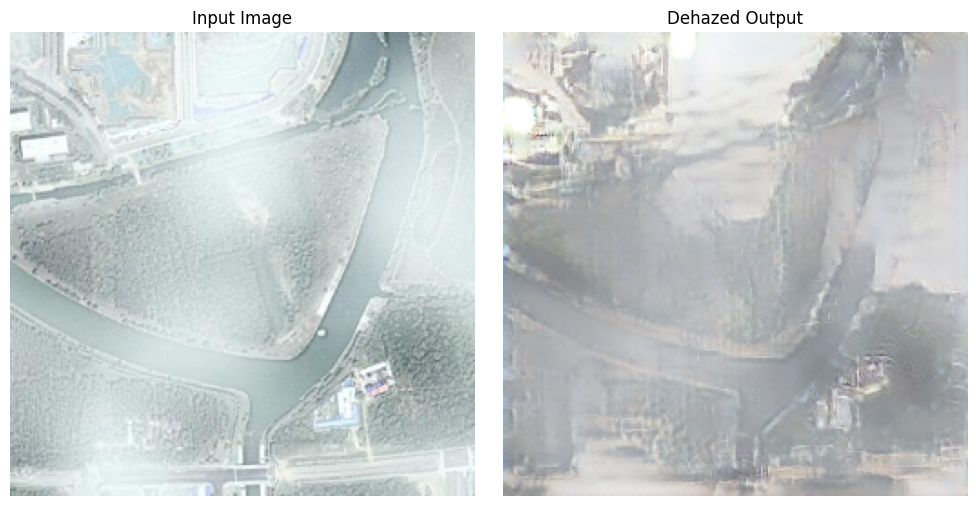

In [14]:
import os
import cv2
import numpy as np 
import tensorflow as tf
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image
import tensorflow_addons as tfa
import gc
import traceback

# Clear previous sessions
tf.keras.backend.clear_session()

# Load model with custom layer
MODEL_PATH = "Nilesh_cycleGAN_dehaze_saved_model"
model = tf.keras.models.load_model(MODEL_PATH, custom_objects={
    "InstanceNormalization": tfa.layers.InstanceNormalization
})
print(f"✅ Model loaded from {MODEL_PATH}")

# Optional: Warm-up model
model.predict(np.random.rand(1, 256, 256, 3).astype(np.float32), verbose=0)

# Preprocess input image (to [-1, 1] as per CycleGAN convention)
def preprocess_image(image_path):
    img = Image.open(image_path).resize((256, 256))
    img_array = np.array(img) / 127.5 - 1.0  # Normalize to [-1, 1]
    return np.expand_dims(img_array, axis=0)

# Postprocess output from [-1, 1] to uint8
def postprocess_output(output):
    output = output[0]
    output = ((output + 1) * 127.5).clip(0, 255).astype(np.uint8)
    return output

# Clear memory
def clear_memory():
    gc.collect()
    tf.keras.backend.clear_session()

# Main dehazing function
def dehaze_image(input_image_path, output_dir=".", display_result=True):
    try:
        input_image = preprocess_image(input_image_path)
        print(f"[INFO] Input shape: {input_image.shape}")

        # Predict
        model_output = model(input_image, training=False).numpy()
        print(f"[INFO] Output shape: {model_output.shape}")

        # Postprocess
        dehazed_image = postprocess_output(model_output)

        # Construct output filename
        base_name = os.path.splitext(os.path.basename(input_image_path))[0]
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_filename = f"{base_name}_dehazed_{timestamp}.jpg"
        output_image_path = os.path.join(output_dir, output_filename)

        # Save output
        Image.fromarray(dehazed_image).save(output_image_path)
        print(f"[SUCCESS] Dehazed image saved at {output_image_path}")

        # Optional display
        if display_result:
            input_img_display = Image.open(input_image_path).resize((256, 256))
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(input_img_display)
            plt.title("Input Image")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(dehazed_image)
            plt.title("Dehazed Output")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        clear_memory()

    except Exception as e:
        print("[ERROR] Something went wrong:")
        traceback.print_exc()

# Example usage
input_image_path = r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\paired_data\train\Input\002.png"
dehaze_image(input_image_path, output_dir=".")


C:\Users\Admin\anaconda3\envs\aitf_env\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


✅ Model loaded from enhance_Nilesh_cycleGAN_dehaze_saved_model
[INFO] Input shape: (1, 256, 256, 3)
[INFO] Output shape: (1, 256, 256, 3)
[SUCCESS] Dehazed image saved at .\039_dehazed_20250420_212548.jpg


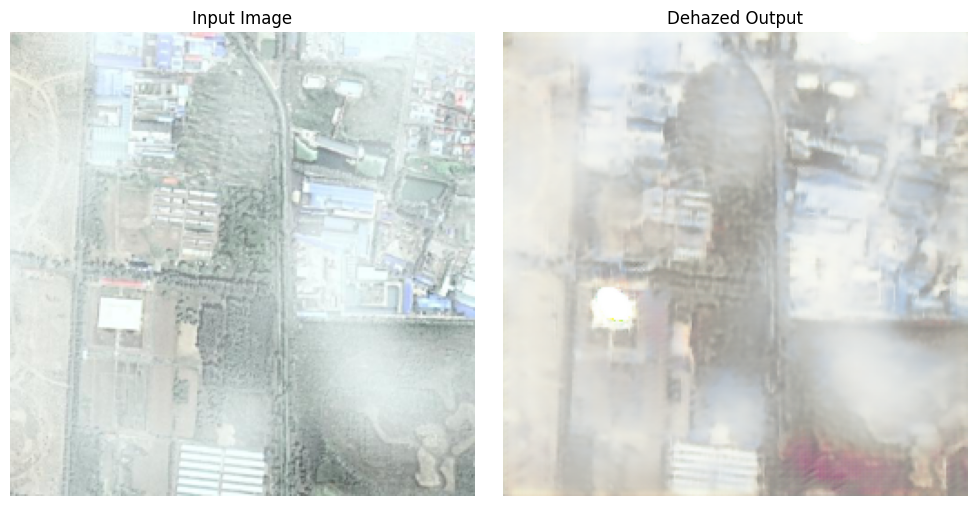

In [10]:
import os
import cv2
import numpy as np 
import tensorflow as tf
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image
import tensorflow_addons as tfa
import gc
import traceback

# Clear previous sessions
tf.keras.backend.clear_session()

# Load model with custom layer
MODEL_PATH = "enhance_Nilesh_cycleGAN_dehaze_saved_model"
model = tf.keras.models.load_model(MODEL_PATH, custom_objects={
    "InstanceNormalization": tfa.layers.InstanceNormalization
})
print(f"✅ Model loaded from {MODEL_PATH}")

# Optional: Warm-up model
model.predict(np.random.rand(1, 256, 256, 3).astype(np.float32), verbose=0)

# Preprocess input image (to [-1, 1] as per CycleGAN convention)
def preprocess_image(image_path):
    img = Image.open(image_path).resize((256, 256))
    img_array = np.array(img) / 127.5 - 1.0  # Normalize to [-1, 1]
    return np.expand_dims(img_array, axis=0)

# Postprocess output from [-1, 1] to uint8
def postprocess_output(output):
    output = output[0]
    output = ((output + 1) * 127.5).clip(0, 255).astype(np.uint8)
    return output

# Clear memory
def clear_memory():
    gc.collect()
    tf.keras.backend.clear_session()

# Main dehazing function
def dehaze_image(input_image_path, output_dir=".", display_result=True):
    try:
        input_image = preprocess_image(input_image_path)
        print(f"[INFO] Input shape: {input_image.shape}")

        # Predict
        model_output = model(input_image, training=False).numpy()
        print(f"[INFO] Output shape: {model_output.shape}")

        # Postprocess
        dehazed_image = postprocess_output(model_output)

        # Construct output filename
        base_name = os.path.splitext(os.path.basename(input_image_path))[0]
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_filename = f"{base_name}_dehazed_{timestamp}.jpg"
        output_image_path = os.path.join(output_dir, output_filename)

        # Save output
        Image.fromarray(dehazed_image).save(output_image_path)
        print(f"[SUCCESS] Dehazed image saved at {output_image_path}")

        # Optional display
        if display_result:
            input_img_display = Image.open(input_image_path).resize((256, 256))
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(input_img_display)
            plt.title("Input Image")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(dehazed_image)
            plt.title("Dehazed Output")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        clear_memory()

    except Exception as e:
        print("[ERROR] Something went wrong:")
        traceback.print_exc()

# Example usage
input_image_path = r"C:\Users\Admin\multispectral_image_dehazing\Data_for_dehazing_model\paired_data\test\Input\039.png"
dehaze_image(input_image_path, output_dir=".")
